## Loading packages

In [19]:
import os

import pandas as pd              # used for data handling
import seaborn as sns            # used for statistical data visualization
import plotly.express as px      # used for performant plotting

## Loading the dataset

The dataset is available online in form of two `csv` files.
Source: tba

In [20]:
path_data = os.path.join("..", "data", "_assets", "act2")

df_processes = pd.read_csv(os.path.join(path_data, "simulated_machine_data.csv"))
df_inspections = pd.read_csv(os.path.join(path_data, "simulated_inspection_data.csv"))

## Quick check data integrity

In [21]:
df_processes

,nr_iteration,process_step_index,timestamp,air_temperature_C,process_speed_mm_s,pressure_measured_bar,pressure_setting_bar,machine_temperature_C
0,0,0,2024-06-01 21:00:00.000,17.411810,10,17.566184,5,17.414191
1,0,0,2024-06-01 21:00:00.200,17.411810,10,14.429097,5,17.414333
2,0,0,2024-06-01 21:00:00.400,17.411810,10,9.850520,5,17.414431
3,0,0,2024-06-01 21:00:00.600,17.411810,10,11.640714,5,17.414852
4,0,0,2024-06-01 21:00:00.800,17.411810,10,9.947243,5,17.415521
...,...,...,...,...,...,...,...,...
199995,4999,2,2024-06-02 08:06:39.000,20.261769,20,28.809045,20,46.332291
199996,4999,2,2024-06-02 08:06:39.200,20.261769,20,29.193165,20,46.332229
199997,4999,2,2024-06-02 08:06:39.400,20.261769,20,26.315095,20,46.329780
199998,4999,2,2024-06-02 08:06:39.600,20.261769,20,23.473967,20,46.327723


In [22]:
df_inspections

,timestamp,error_code
0,2024-06-01 21:00:09.526317,OK
1,2024-06-01 21:00:19.902254,NOK_4
2,2024-06-01 21:00:26.956506,NOK_4
3,2024-06-01 21:00:34.250145,OK
4,2024-06-01 21:00:44.520231,NOK_4
...,...,...
4995,2024-06-02 08:06:12.105654,OK
4996,2024-06-02 08:06:20.692947,OK
4997,2024-06-02 08:06:28.295564,OK
4998,2024-06-02 08:06:33.039826,OK


In [23]:
if df_processes.isna().sum().sum() > 0 or \
   df_inspections.isna().sum().sum() > 0 or \
   df_processes.duplicated().sum().sum() > 0 or \
   df_inspections.duplicated().sum().sum() > 0:
     raise ValueError("Missing values or duplicates found in the dataframes.")
else:
    print("No missing values or duplicates found in the dataframes.")

No missing values or duplicates found in the dataframes.


In [24]:
df_processes.describe().T

,count,mean,std,min,25%,50%,75%,max
nr_iteration,200000.0,2499.500000,1443.379253,0.000000,1249.750000,2499.500000,3749.250000,4999.000000
process_step_index,200000.0,0.625000,0.856959,0.000000,0.000000,0.000000,1.250000,2.000000
air_temperature_C,200000.0,13.240958,2.849175,10.000000,10.648648,12.539426,15.382514,20.261769
process_speed_mm_s,200000.0,11.375000,5.764941,1.000000,10.000000,10.000000,12.500000,20.000000
pressure_measured_bar,200000.0,27.631799,30.724554,2.667229,11.501248,13.684438,27.005894,116.061456
pressure_setting_bar,200000.0,20.625000,30.663318,5.000000,5.000000,5.000000,20.000000,100.000000
machine_temperature_C,200000.0,37.337208,4.591688,17.414191,36.019951,37.328398,39.323185,46.359040


In [25]:
df_processes.dtypes

nr_iteration               int64
process_step_index         int64
timestamp                 object
air_temperature_C        float64
process_speed_mm_s         int64
pressure_measured_bar    float64
pressure_setting_bar       int64
machine_temperature_C    float64
dtype: object

In [26]:
df_inspections.dtypes

timestamp     object
error_code    object
dtype: object

In [27]:
df_processes.nunique()

nr_iteration               5000
process_step_index            3
timestamp                200000
air_temperature_C           501
process_speed_mm_s            3
pressure_measured_bar    200000
pressure_setting_bar          3
machine_temperature_C    200000
dtype: int64

In [28]:
df_inspections.nunique()

timestamp     5000
error_code       5
dtype: int64

In [29]:
df_inspections["error_code"].value_counts()

error_code
OK       4662
NOK_4     265
NOK_1      62
NOK_3      10
NOK_2       1
Name: count, dtype: int64

NOK_2 and NOK_3 seem to be hardly ever happening.
Let us mentally drop these error codes for this investigation, since <= 10 samples give a very weak statistical basis and tend to distort plots.

## Exploring continuous variables by simple plots

Here, we visualize the continuous variables (one by one) against the timestamp to get an idea of their temporal behavior.

In [30]:
CONTINUOUS_VARS = [
    "air_temperature_C",
    "process_speed_mm_s",
    "pressure_measured_bar",
    "pressure_setting_bar",
    "machine_temperature_C",
]

In [31]:
df_filtered = df_processes.query("nr_iteration < 1000").sort_values("timestamp")  # for performance reasons, we filter to the first 1000 cycles.

fig = px.line(
    df_filtered,
    x="timestamp",
    y=CONTINUOUS_VARS,
    facet_col="variable",
    facet_col_wrap=1,
    title="Continuous Variables Over Time"
)

fig.update_xaxes(matches='x')    # share x-axis zoom/pan
fig.update_yaxes(matches=None)   # do not share y-axis limits
fig.update_layout(height=1200)   # increase figure height (y axis size)

fig.show()


The plot is interactive.
Zoom in to see more details.
Observe that the set pressure is constant over time (within a processing step), while the measured pressure varies around the set pressure and also shows some systematic offset.

Let us investigate this difference between set and measured pressure in more detail.

In [32]:
df_processes["pressure_difference_bar"] = df_processes["pressure_measured_bar"] - df_processes["pressure_setting_bar"]

<Axes: xlabel='pressure_difference_bar', ylabel='Count'>

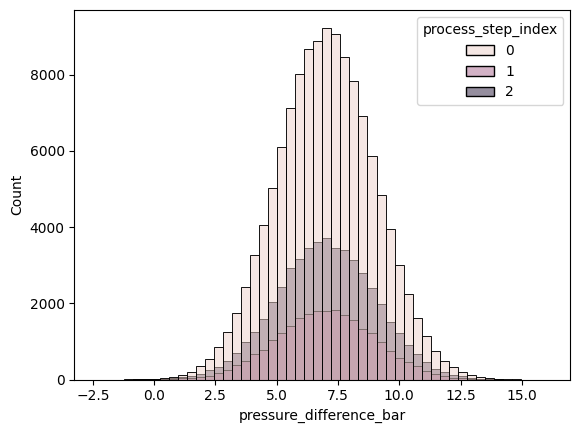

In [33]:
sns.histplot(data=df_processes, x="pressure_difference_bar", hue="process_step_index", bins=50)

It appears like the pressure difference is roughly normally distributed and that the mean of the three processing steps is similar.

Absolute counts are visually harder to compare, so let us use relative frequencies instead and normalize each of the processing steps separately.

<Axes: xlabel='pressure_difference_bar', ylabel='Percent'>

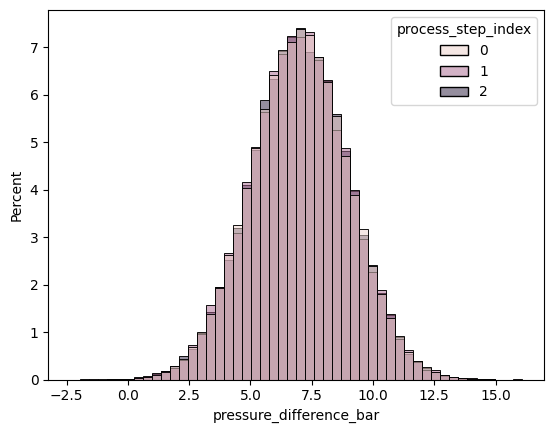

In [34]:
sns.histplot(data=df_processes, x="pressure_difference_bar", hue="process_step_index", bins=50, common_norm=False, stat="percent")  # common_norm is set to False to normalize each processing step separately, stat is set to "percent" to show relative frequencies in percent.

Apparently the pressure difference shares similar mean and standard deviation across the three processing steps.
We can also show this by calculating the mean and standard deviation of the pressure difference for each processing step.

In [35]:
df_processes.groupby("process_step_index")["pressure_difference_bar"].mean()

process_step_index
0    7.008735
1    6.997252
2    7.006735
Name: pressure_difference_bar, dtype: float64

In [36]:
df_processes.groupby("process_step_index")["pressure_difference_bar"].std()

process_step_index
0    1.994644
1    2.007884
2    1.995821
Name: pressure_difference_bar, dtype: float64

We conclude that the pressure is not perfectly controlled (or measured) and have a systematic offset of 7 bar and a standard deviation of roughly 2 bar.

In [37]:
fig = px.line(
    df_processes.sample(10_000).sort_values("timestamp"),  # for performance reasons, we sample 10,000 rows. Always remember to sort by timestamp after sampling.
    x="timestamp",
    y=["machine_temperature_C", "air_temperature_C"],
    labels={"value": "Temperature (°C)", "timestamp": "Timestamp", "variable": "Type"},
    title="Machine and Air Temperature Over Time"
)
fig.show()


We observe that the machine is in a cold state when the data collection starts and heats up to a more stable plateau, where it still seems to follow the shape of the air temperature.

## Aggregating plots

We are looking at iterations of the same, identical process.
Let us look at a plot where the processes overlap each other, colored by error code.

First, we create a new index which starts at 0 for each piece that is manufactured and counts each timestamp within that process step.
This index will be useful for plotting the different process iterations on top of each other.

In [38]:
df_processes['process_inner_index'] = df_processes.sort_values('timestamp').groupby('nr_iteration').cumcount()

In [39]:
# Merge error_code from df_inspections into df_processes based on 'nr_iteration'. This assigns an errorcode to the entire process iteration.
df_plot = df_processes.merge(
    df_inspections,
    left_on="nr_iteration",
    right_index=True,
    how="left"
)

fig = px.line(
    df_plot,
    x="process_inner_index",
    y="pressure_measured_bar",
    line_group="nr_iteration",
    color="error_code",
    title="Pressure per Iteration (Overlapped, Colored by Error Code)",
    labels={
        "process_inner_index": "Inner-process timestamp",
        "pressure_measured_bar": "Pressure (bar)",
        "error_code": "Error Code"
    },
)

# Set opacity: 0.01 for 'OK', 0.5 for others
# Setting opacity is always a bit tricky. Setting it too low makes the lines almost invisble, setting it too high makes the plot too crowded.
# This settings were found in trial and error and work well for that case.
for trace in fig.data:
    if trace.name == "OK":
        trace.opacity = 0.01
    else:
        trace.opacity = 0.5

# Unselect NOK_2 and NOK_3 by default, since they are very rare and would clutter the plot.
for i, trace in enumerate(fig.data):
    if trace.name in ["NOK_2", "NOK_3"]:
        fig.data[i].visible = "legendonly"

fig.update_layout(showlegend=True)
fig.show()

Keep in mind that you can (de)select lines to plot when clicking on the according legend entry.
Plotly also allows you to zoom in and pan around.

From the plot, we can see that the second processing step's pressure is elevated for `NOK_1`.
`NOK_4` shows no obvious difference to `OK`.

With this in mind, let us have a closer look at the mean pressure and its standard deviation per error code and processing step.

In [40]:
# Aggregate: mean and std for each process_inner_index and error_code
agg_df = df_plot.groupby(['process_inner_index', 'error_code'])['pressure_measured_bar'].agg(['mean', 'std']).reset_index()

fig = px.line(
    agg_df,
    x="process_inner_index",
    y="mean",
    color="error_code",
    error_y="std",
    labels={
        "process_inner_index": "Inner-process timestamp",
        "mean": "Pressure (bar)",
        "error_code": "Error Code"
    },
    title="Mean Pressure per Error Code with Deviation"
)

# Unselect NOK_2 and NOK_3 by default
for i, trace in enumerate(fig.data):
    if trace.name in ["NOK_2", "NOK_3"]:
        fig.data[i].visible = "legendonly"
        
fig.update_layout(legend_title_text='Error Code')
fig.show()

This plot confirms our previous observation that `NOK_1` has a systematic higher mean pressure during the second processing step and `NOK_4` does not differ notably from `OK`.

While the first line plot shows every individual process iteration as a singe line and therefor does not accidentally filter relevant information, it is a bit crowded and hard to read.
The second plot aggregates the individual lines by calculating the mean and standard deviation, therefore losing some information, but making it easier to comprehend.

Now let us also check whether the machine temperature has an influence on failures.

In [41]:
df_agg = df_plot.groupby(['nr_iteration', 'error_code'])['machine_temperature_C'].agg(['mean']).reset_index()

fig = px.box(
    df_agg,
    x="error_code",
    y="mean",
    title="Machine Temperature by Error Code",
    labels={"mean": "Mean Machine Temperature (°C)", "error_code": "Error Code"}
)

fig.show()

Also here, `NOK_4` and `NOK_1` do not show a notable difference to `OK`, while `NOK_2` and `NOK_3` can not be judged well due to the low sample size.

Let us summarize our findings so far in this data set:
- The pressure during the second processing step is elevated for `NOK_1` compared to `OK`.
- The machine temperature does not show a notable difference between `OK` and `NOK_x`.
- The source of `NOK_4` failures was not identified in this analysis.
- The error codes `NOK_2` and `NOK_3` are too rare to draw any conclusions.